# Dry Advection

Simulate plume evolution under wind advection.


DryAdvection vs CoCiP

In [1]:
import matplotlib.pyplot as plt
import pandas as pd

from pycontrails import Flight
from pycontrails.datalib.ecmwf import ERA5
from pycontrails.models.cocip import Cocip
from pycontrails.models.dry_advection import DryAdvection
from pycontrails.models.humidity_scaling import ConstantHumidityScaling
from pycontrails.models.ps_model import PSModel
from pycontrails.physics import units

plt.rcParams["figure.figsize"] = (10, 6)

## Load meteorological data

In [2]:
time_bounds = ("2022-03-01 00:00:00", "2022-03-01 12:00:00")
pressure_levels = (300, 250, 200)

era5pl = ERA5(
    time=time_bounds,
    variables=Cocip.met_variables + Cocip.optional_met_variables,
    pressure_levels=pressure_levels,
)
era5sl = ERA5(time=time_bounds, variables=Cocip.rad_variables)

met = era5pl.open_metdataset()
rad = era5sl.open_metdataset()

In [3]:
df = pd.read_csv("flight.csv")
# Clip at 33,000 ft
df["altitude"] = df["altitude"].clip(upper=units.ft_to_m(33000))
fl = Flight(df, aircraft_type="A320", flight_id="example")

In [4]:
dt_integration = pd.Timedelta("2T")
max_age = pd.Timedelta("6h")

params = {
    "dt_integration": dt_integration,
    "max_age": max_age,
    "depth": 50.0,
    "width": 40.0,
}
dry_adv = DryAdvection(met, params)
dry_adv_df = dry_adv.eval(fl).dataframe

Text(0.5, 1.0, 'Flight path and plume evolution under dry advection')

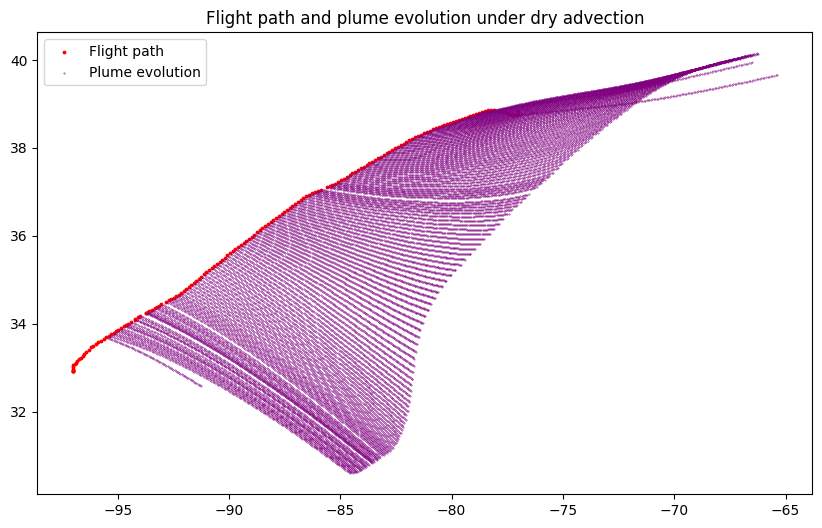

In [5]:
ax = plt.axes()

ax.scatter(fl["longitude"], fl["latitude"], s=3, color="red", label="Flight path")
ax.scatter(
    dry_adv_df["longitude"], dry_adv_df["latitude"], s=0.1, color="purple", label="Plume evolution"
)
ax.legend()
ax.set_title("Flight path and plume evolution under dry advection")

## Comparison with CoCiP

In [6]:
params = {
    "dt_integration": dt_integration,
    "max_age": max_age,
    "humidity_scaling": ConstantHumidityScaling(rhi_adj=0.9),
    "aircraft_performance": PSModel(),
}
cocip = Cocip(met, rad, params)
cocip.eval(fl)
cocip_df = cocip.contrail

Text(0.5, 1.0, 'Flight path and plume evolution under CoCiP')

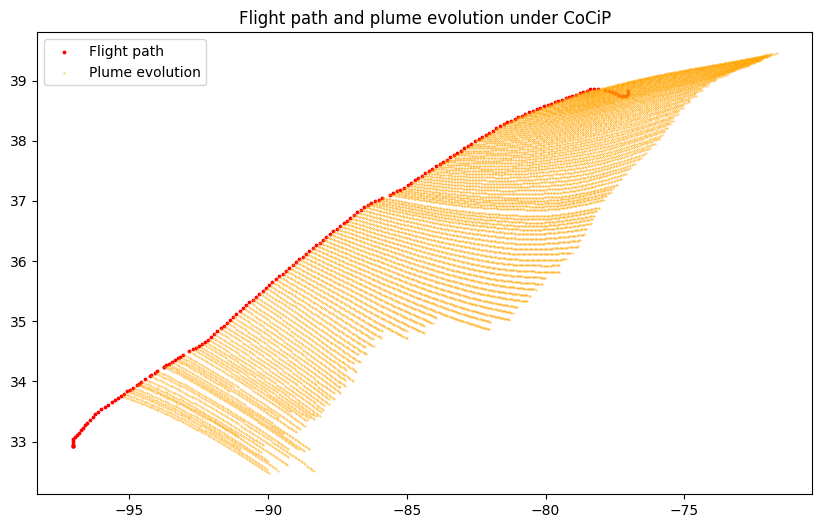

In [7]:
ax = plt.axes()

ax.scatter(fl["longitude"], fl["latitude"], s=3, color="red", label="Flight path")
ax.scatter(
    cocip_df["longitude"], cocip_df["latitude"], s=0.1, color="orange", label="Plume evolution"
)
ax.legend()
ax.set_title("Flight path and plume evolution under CoCiP")

### Animate

In [8]:
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image

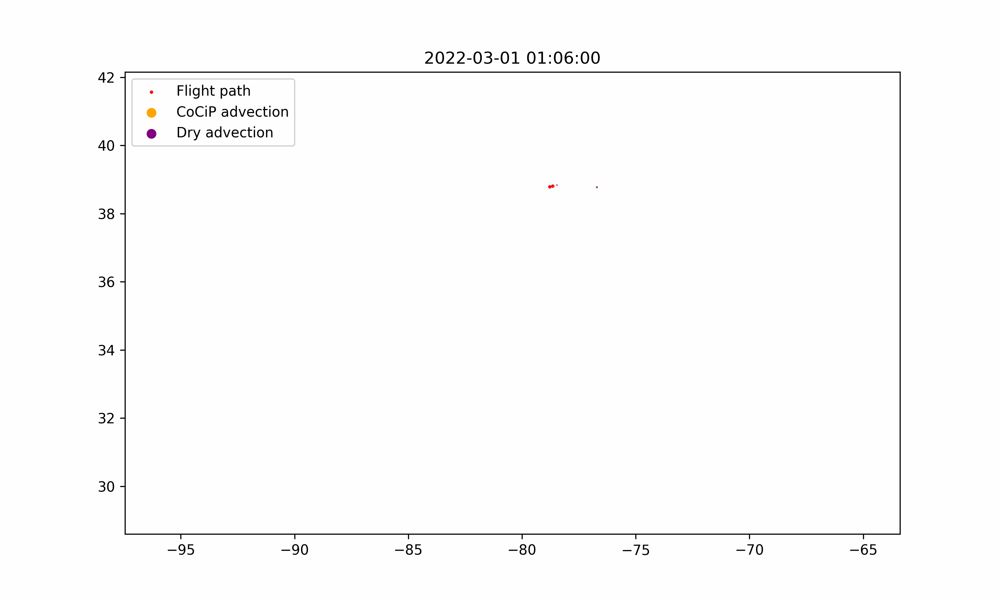

In [9]:
fig, ax = plt.subplots()
ax.set_xlim(dry_adv_df["longitude"].min() - 2, dry_adv_df["longitude"].max() + 2)
ax.set_ylim(dry_adv_df["latitude"].min() - 2, dry_adv_df["latitude"].max() + 2)

scat1 = ax.scatter([], [], s=2, color="red", label="Flight path")
scat2 = ax.scatter([], [], color="orange", label="CoCiP advection")
scat3 = ax.scatter([], [], color="purple", label="Dry advection")
ax.legend(loc="upper left")

source_frames = fl.dataframe.groupby(fl.dataframe["time"].dt.ceil(dt_integration))
dry_adv_frames = dry_adv_df.groupby(dry_adv_df["time"].dt.ceil(dt_integration))
cocip_frames = cocip_df.groupby(cocip_df["time"].dt.ceil(dt_integration))


times = cocip_frames.indices


def animate(time):
    ax.set_title(time)

    try:
        group = source_frames.get_group(time)
    except KeyError:
        offsets = [[None, None]]
    else:
        offsets = group[["longitude", "latitude"]]
    scat1.set_offsets(offsets)

    group = cocip_frames.get_group(time)
    offsets = group[["longitude", "latitude"]]
    width = 1e-3 * group["width"]
    scat2.set_offsets(offsets)
    scat2.set_sizes(width)

    group = dry_adv_frames.get_group(time)
    offsets = group[["longitude", "latitude"]]
    width = 1e-3 * group["width"]
    scat3.set_offsets(offsets)
    scat3.set_sizes(width)

    return scat1, scat2


plt.close()
ani = FuncAnimation(fig, animate, frames=times)
ani.save("evo.gif", dpi=300, writer=PillowWriter(fps=10))

# Show the gif
with open("evo.gif", "rb") as f:
    display(Image(data=f.read(), format="png"))

## Emissions species